<a href="https://colab.research.google.com/github/SamuelMatthew31/GoogleColab/blob/Image_Processing/Pertemuan2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Blending Two Images Using Cross-Dissolving

In [31]:
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract
from skimage.io import imread, imshow, show
from skimage.transform import SimilarityTransform, warp, swirl
from scipy.ndimage import affine_transform
import matplotlib.pylab as plt
import matplotlib.image as mpimg

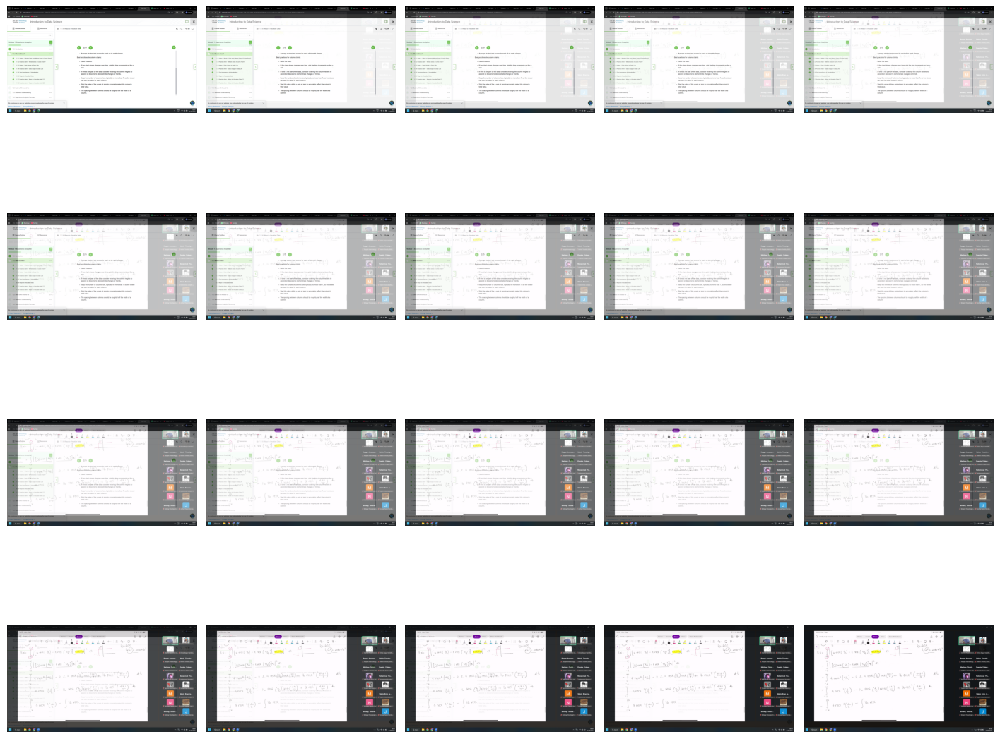

In [43]:
import numpy as np
im1 = mpimg.imread("/content/image3.png")
im2 = mpimg.imread("/content/image2.png")
i = 1
plt.figure(figsize=(18,15))
for alpha in np.linspace(0,1,20):
  plt.subplot(4,5,i)
  plt.imshow((1-alpha)*im1 + alpha*im2)
  plt.axis('off')
  i += 1
plt.subplots_adjust(wspace=0.05 , hspace=0.05)
plt.show()

# Image Manipulation with PIL

In [66]:
from PIL import Image, ImageFont, ImageDraw
from PIL.ImageChops import add, subtract
from skimage.io import imread, imshow, show
from skimage.transform import SimilarityTransform, warp, swirl
from scipy.ndimage import affine_transform
import matplotlib.pylab as plt
import matplotlib.image as mpimg

In [105]:
im3 = Image.open("/content/image4.png")
print(im3.width, im3.height, im3.mode, im3.format)

601 407 RGBA PNG


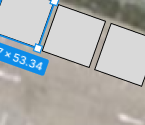

In [71]:
#crop the rectangle given by (left, top, right, button)
im3_crop = im3.crop((175, 75, 320, 200))
display(im3_crop)

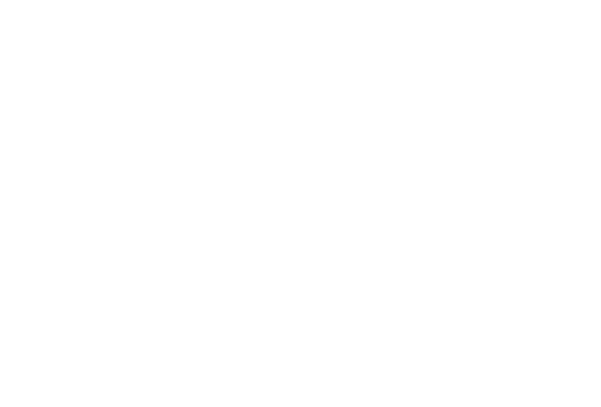

In [76]:
im3_negative = im3.point(lambda x: 255-x)
display(im3_negative)

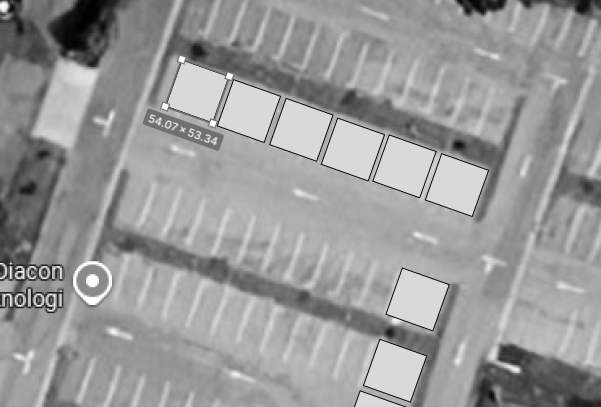

In [73]:
im_grayscale = im3.convert('L')
display(im_grayscale)

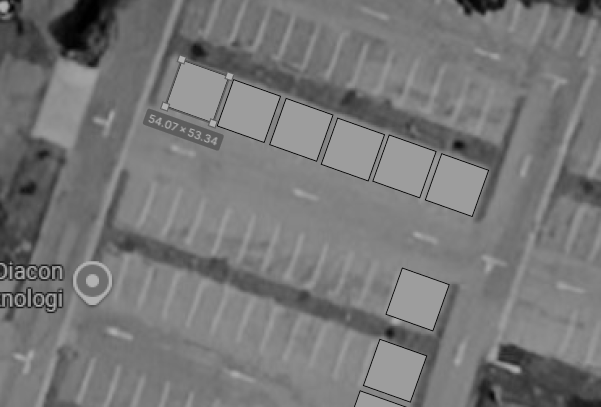

In [79]:
display(im_grayscale.point(lambda x: 255*np.log(1+x/255)))

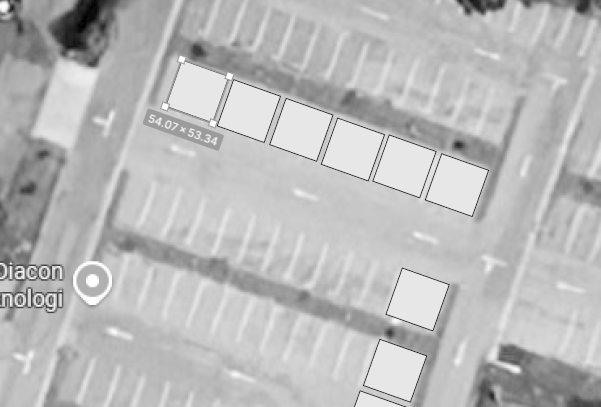

In [80]:
display(im_grayscale.point(lambda x: 255*(x/255)**0.6))

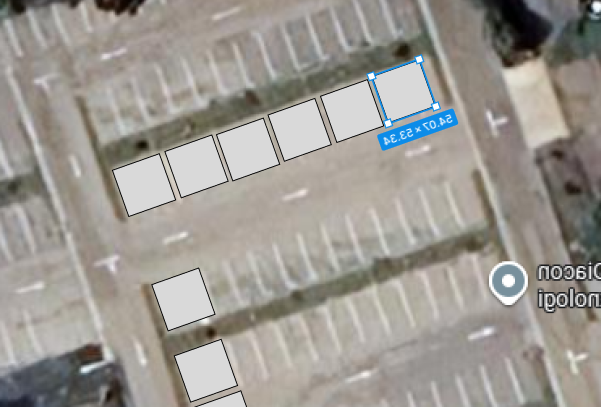

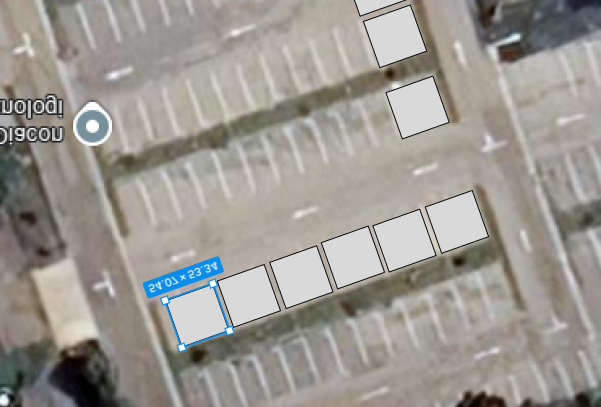

In [83]:
#reflect about the vertical axis
im3_rotate1 = im3.transpose(Image.FLIP_LEFT_RIGHT)
display(im3_rotate1)
#reflect about the horizontal axis
im3_rotate1 = im3.transpose(Image.FLIP_TOP_BOTTOM)
display(im3_rotate1)

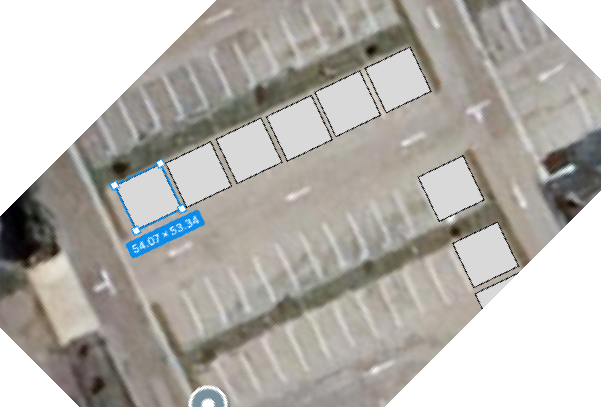

In [84]:
im3_rotate45 = im3.rotate(45)
display(im3_rotate45)

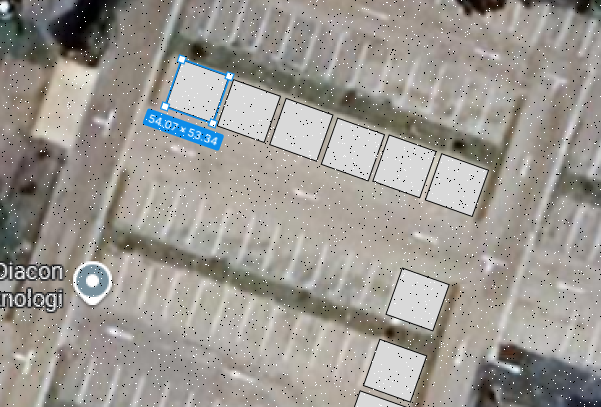

In [85]:
#Choose 5000 random locations inside image
imcopy = im3.copy() #Keep the original image, create a copy\
n = 5000
x, y = np.random.randint(0, imcopy.width, n), np.random.randint(0, imcopy.height, n)
for (x,y) in zip(x,y):
  imcopy.putpixel((x,y), ((0,0,0) if np.random.rand() < 0.5 else
   (255,255,255)))
display(imcopy)

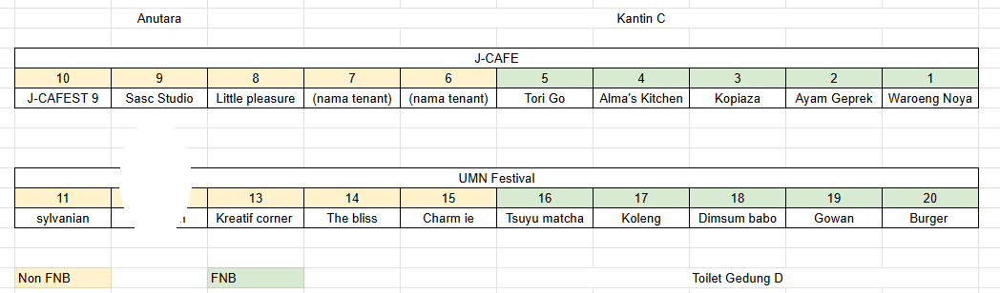

In [87]:
im4 = Image.open("/content/image1.png")
draw = ImageDraw.Draw(im4)
draw.ellipse((125, 125, 200, 250), fill= (255, 255, 255, 128))
del draw
display(im4)

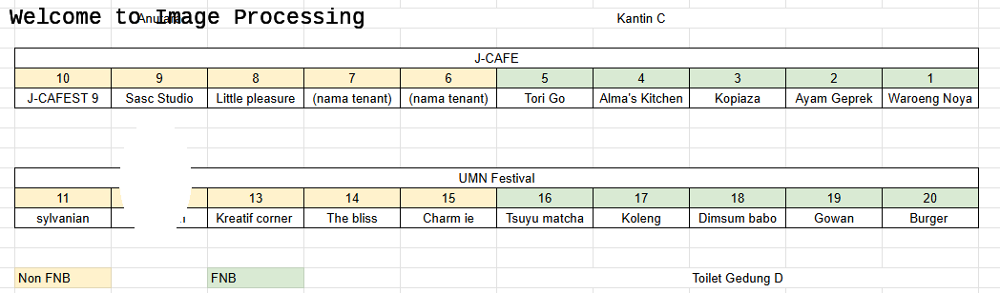

In [100]:
draw = ImageDraw.Draw(im4)
font = ImageFont.truetype("LiberationMono-Regular.ttf", 23) #use a truetype font
draw.text((10, 5), "Welcome to Image Processing", font=font, fill=(0,0,0))
del draw
display(im4)

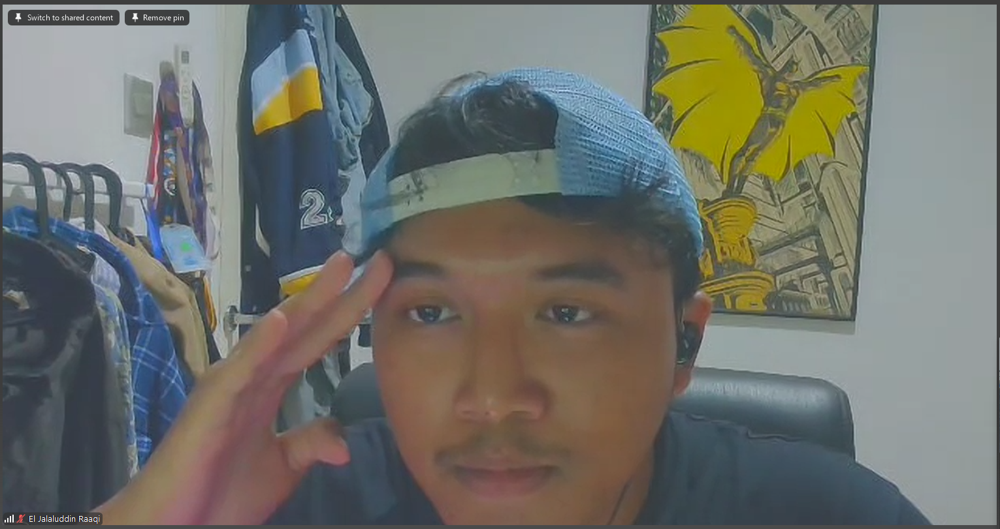

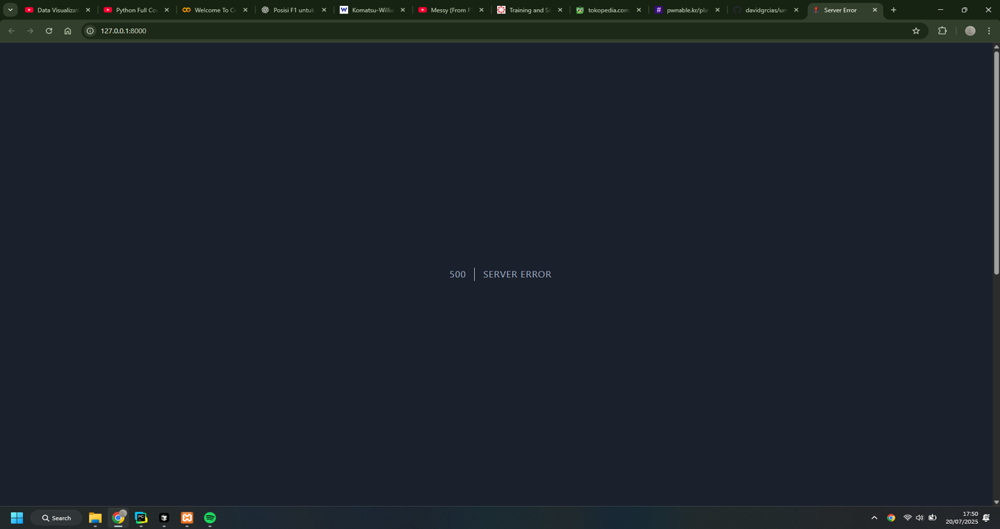

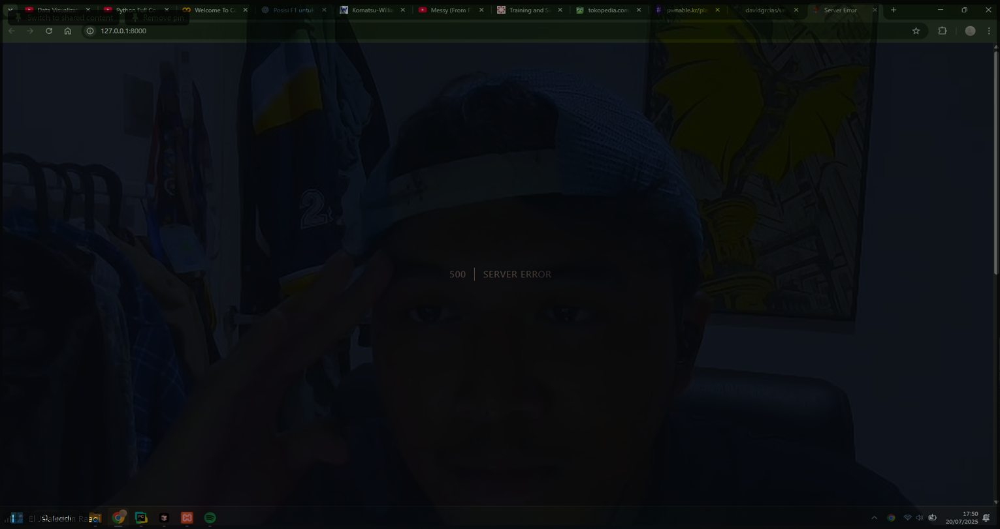

In [112]:
from PIL import Image, ImageChops

im5 = Image.open("/content/image5.png").convert('RGB') # Convert im5 to RGB mode
im6 = Image.open("/content/image6.png").convert('RGB').resize((im5.width, im5.height))
# The display(im5) line below will still show the original im5 image
display(im5)
# The display(im6) line below will still show the original im5 image
display(im6)
# Use display() instead of show() to show the image inline in Colab
display(ImageChops.multiply(im5, im6))


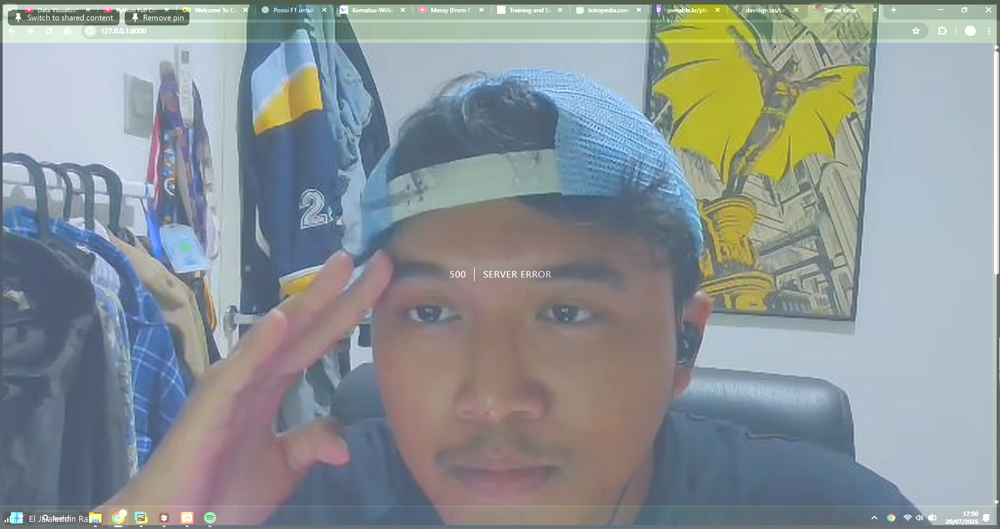

In [114]:
display(add(im5, im6))

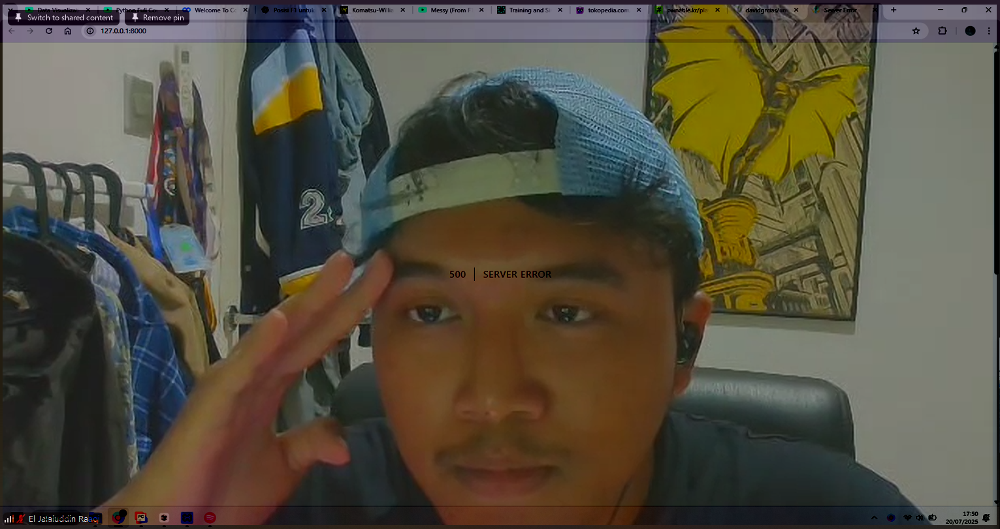

In [116]:
display(subtract(im5, im6))

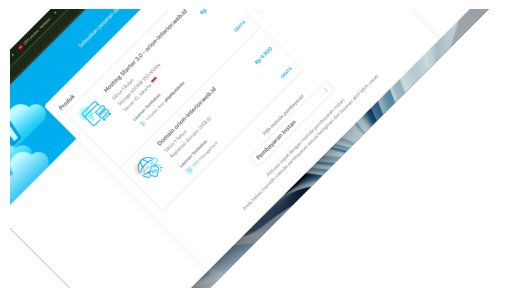

(<matplotlib.image.AxesImage at 0x7c898fa5d4f0>,
 (np.float64(-0.5), np.float64(1918.5), np.float64(1078.5), np.float64(-0.5)),
 None)

In [117]:
im = imread("/content/image7.png")
tform = SimilarityTransform(scale=0.9, rotation=np.pi/4,translation=(im.shape[0]/2, -100))
warped = warp(im, tform)
plt.imshow(warped), plt.axis('off'), plt.show()

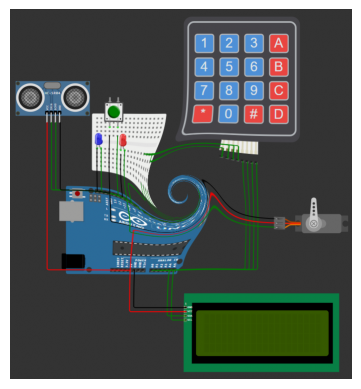

(<matplotlib.image.AxesImage at 0x7c898f87cfe0>,
 (np.float64(-0.5), np.float64(762.5), np.float64(824.5), np.float64(-0.5)),
 None)

In [121]:
im = imread("/content/image8.png")
swirled = swirl(im, rotation=0,
                strength=15, radius=200)
plt.imshow(swirled), plt.axis('off'), plt.show()